# PROJETO DE PDI
-  GRUPO: YAN BORGES, VLADIMIR YURI, VÍTOR ZIMBRUNES, JOÃO NETO E THIAGO VANNUCCI

## IMPORTAÇÃO DE BIBLIOTECAS

In [4]:
from PIL import Image
import matplotlib.image as mat_im
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.tri as tri
import math

# CRIAÇÃO DAS FUNÇÕES PARA ABRIR, SALVAR E PARA TRANSFORMAÇÕES

In [2]:
#FUNÇÃO PARA ABRIR E EXIBIR
def open_image(img):
  image = Image.open(img)
  return image

#FUNÇÃO PARA SALVAR
def save_image(img, name, ext):
  image = img.save(f"{name}.{ext}")
  return image

#FUNÇÃO PARA VISUALIZAR DIMENSÕES
def dim_image(img):
  RGB = mat_im.imread(img)
  shape_img = RGB.shape
  print(f'PIXELS: {shape_img[0]}x{shape_img[1]}\nCANAIS DE CORES: {shape_img[2]}')

# QUESTÃO 01 - CONVERSÃO RGB-HSB-RGB

In [34]:
def RGB_to_HSB(pixel, mods=None):
  R, G, B = pixel
  pixel  =  R / 255, G / 255, B / 255
  R, G, B = pixel

  MAX = max(pixel)
  MIN = min(pixel)

  # Valor da matiz
  H = None
  S = None
  if(MAX == MIN):
      H = -1
  elif((MAX == R)):
      if(G >= B):
          H = 60 * ((G - B)/(MAX - MIN))
      else:
          H = (60 * ((G - B)/(MAX - MIN))) + 360

  elif(MAX == G):
      H = (60 * ((B - R)/(MAX - MIN))) + 120

  elif(MAX == B):
      H = (60 * ((R - G)/(MAX - MIN))) + 240

  # Saturação
  if(MAX == 0):
      S = 0
  else:
      S = 1 - (MIN/ MAX)

  #Valor ou Brilho
  B = MAX

  if mods == None:
      return round(H), round(S, 2), round(B, 2)
  else:
      # angle factor
      H_ = H + mods["angle_factor"]

      if(H_ > 360):
          H = H_ - 360
      elif(H_ < 0):
          H = 360 + H_
      else:
          H  = H_

      S_ = S * mods["sat_factor"]
      S = S_ if S_ <= 1 else 1

      return round(H), round(S, 2), round(B, 2)

def HSB_to_RGB(pixel):
  H, S, V = pixel

  if H == -1:  # Matiz indefinida
        R = G = B = int(V * 255)
  else:
      C = V * S
      X = C * (1 - abs((H /60) % 2 - 1))
      m = V - C

      if(0 <= H < 60):
          R_ = C
          G_ = X
          B_ = 0
      elif(60 <= H < 120):
          R_ = X
          G_ = C
          B_ = 0
      elif(120 <= H < 180):
          R_ = 0
          G_ = C
          B_ = X
      elif(180 <= H < 240):
          R_ = 0
          G_ = X
          B_ = C
      elif(240 <= H < 300):
          R_ = X
          G_ = 0
          B_ = C
      elif(300 <= H <= 360):
          R_ = C
          G_ = 0
          B_ = X

      R, G, B  = ((R_ + m) * 255, (G_ + m) * 255, (B_ + m) * 255)
  return  int(R), int(G), int(B)

#FUNÇÕES PARA APLICAR AS TRANSFORMAÇÕES
def APLICA_RGB_HSB(img , mods=None):
  img = mat_im.imread(img)
  height , width, _ = img.shape

  image_result = []
  for i in range(height):
      column = []
      for j in range(width):
          column.append(list(RGB_to_HSB(img[i][j], mods)))
      image_result.append(column)

  return np.array(image_result)

def APLICA_HSB_RGB(img):

  height , width= img.shape[:2]

  image_result = []
  for i in range(height):
      column = []
      for j in range(width):
          column.append(list(HSB_to_RGB(img[i][j])))
      image_result.append(column)

  return np.array(image_result)

### TESTE COM IMAGEM

In [3]:
#Aqui, copie o caminho da imagem escolhida
img = "/content/DancingInWater.jpg"

In [ ]:
#Abre a imagem
new_image = open_image(img)

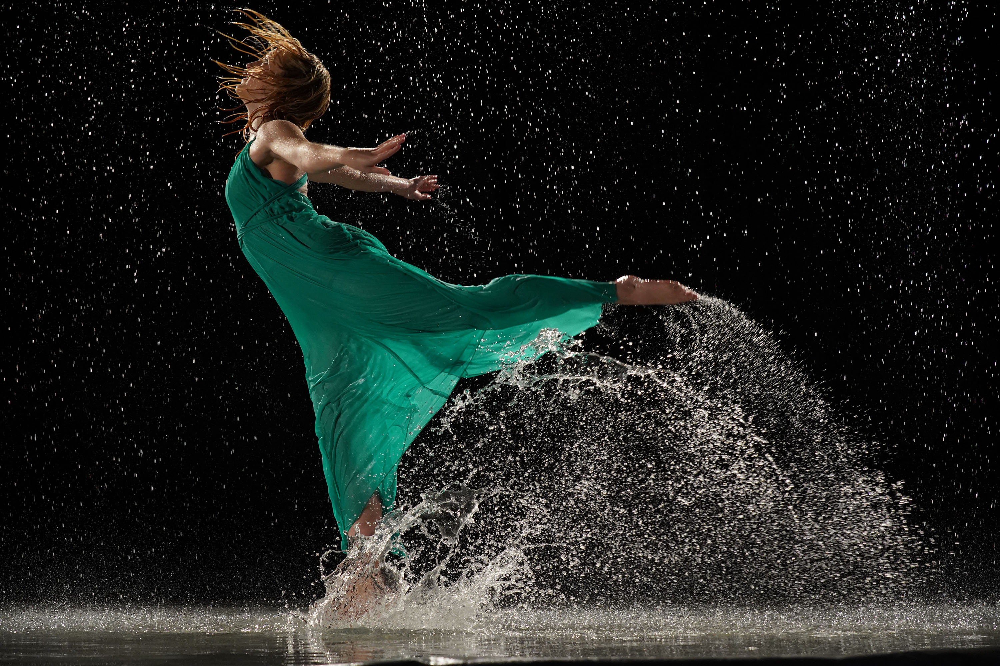

In [ ]:
new_image

In [5]:
#Salva a imagem
name = str(input("Informe um nome para a imagem: "))
ext = str(input("Informe a extensão da imagem: "))

save_image(new_image, name, ext)

### VISUALIZAÇÃO DE DIMENSÃO

In [ ]:
path = f'/content/{name}.{ext}'

In [ ]:
dim_image(path)

PIXELS: 2000x3000
CANAIS DE CORES: 3


### VISUALIZAÇÃO DE MATRIZ RGB ORIGINAL

In [ ]:
img = mat_im.imread(path) #carrega a imagem salva

In [ ]:
img

array([[[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[ 1,  1,  1],
        [ 1,  1,  1],
        [ 1,  1,  1],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       ...,

       [[29, 28, 24],
        [30, 29, 25],
        [28, 27, 23],
        ...,
        [ 6,  6,  8],
        [ 6,  6,  8],
        [ 6,  6,  8]],

       [[28, 27, 23],
        [31, 30, 26],
        [29, 28, 24],
        ...,
        [ 6,  6,  8],
        [ 6,  6,  8],
        [ 6,  6,  8]],

       [[27, 26, 22],
        [31, 30, 26],
        [30, 29, 25],
        ...,
        [ 6,  6,  8],
        [ 6,  6,  8],
        [ 6,  6,  8]]], dtype=uint8)

### CONVERTE A IMAGEM PARA HSB

In [ ]:
HSB = APLICA_RGB_HSB(img)

In [ ]:
HSB

array([[[0.0e+00, 0.0e+00, 0.0e+00],
        [0.0e+00, 0.0e+00, 0.0e+00],
        [0.0e+00, 0.0e+00, 0.0e+00],
        ...,
        [0.0e+00, 0.0e+00, 1.0e-02],
        [0.0e+00, 0.0e+00, 1.0e-02],
        [0.0e+00, 0.0e+00, 1.0e-02]],

       [[0.0e+00, 0.0e+00, 0.0e+00],
        [0.0e+00, 0.0e+00, 0.0e+00],
        [0.0e+00, 0.0e+00, 0.0e+00],
        ...,
        [0.0e+00, 0.0e+00, 1.0e-02],
        [0.0e+00, 0.0e+00, 1.0e-02],
        [0.0e+00, 0.0e+00, 1.0e-02]],

       [[0.0e+00, 0.0e+00, 0.0e+00],
        [0.0e+00, 0.0e+00, 0.0e+00],
        [0.0e+00, 0.0e+00, 0.0e+00],
        ...,
        [0.0e+00, 0.0e+00, 1.0e-02],
        [0.0e+00, 0.0e+00, 1.0e-02],
        [0.0e+00, 0.0e+00, 1.0e-02]],

       ...,

       [[4.8e+01, 1.7e-01, 1.1e-01],
        [4.8e+01, 1.7e-01, 1.2e-01],
        [4.8e+01, 1.8e-01, 1.1e-01],
        ...,
        [2.4e+02, 2.5e-01, 3.0e-02],
        [2.4e+02, 2.5e-01, 3.0e-02],
        [2.4e+02, 2.5e-01, 3.0e-02]],

       [[4.8e+01, 1.8e-01, 1.1e-01],
  

### CONVERTE A IMAGEM PARA RGB

In [ ]:
RGB = APLICA_HSB_RGB(HSB)

In [ ]:
RGB

array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]],

       ...,

       [[28, 27, 23],
        [30, 29, 25],
        [28, 27, 23],
        ...,
        [ 5,  5,  7],
        [ 5,  5,  7],
        [ 5,  5,  7]],

       [[28, 27, 23],
        [30, 29, 25],
        [28, 27, 23],
        ...,
        [ 5,  5,  7],
        [ 5,  5,  7],
        [ 5,  5,  7]],

       [[28, 26, 22],
        [30, 29, 25],
        [30, 29, 25],
        ...,
        [ 5,  5,  7],
        [ 5,  5,  7],
        [ 5,  5,  7]]])

# QUESTÃO 2 - FILTROS MULTIPLICATIVOS E ADITIVO

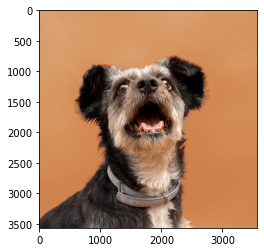

In [5]:
img_path = 'cachorro.jpg'
plt.imshow(mat_im.imread(img_path))

In [ ]:
def filtro_mult_add_hsb(img_path, f_saturacao, f_brilho, a_matiz):

    # Convertendo para o espaço HSB
    hsb_image = APLICA_RGB_HSB(img_path)
    
    # Multiplicativo de saturação
    hsb_image[:, :, 1] = np.clip(hsb_image[:, :, 1] * f_saturacao, 0, 255)

    # Multiplicativo de brilho
    hsb_image[:, :, 2] = np.clip(hsb_image[:, :, 2] * f_brilho, 0, 255)

    # Aditivo de matiz 
    hsb_image[:, :, 0] = (hsb_image[:, :, 0] + a_matiz) % 180

    # Convertendo de volta para o espaço de cores RGB
    rgb_image = APLICA_HSB_RGB(hsb_image)
    
    return rgb_image

In [ ]:
# Determinando os fatores multiplicativos e aditivos
fator_saturacao= 1.5  
fator_brilho = 1.2  
fator_matiz = 20  

# Aplicando os filtros
imagem_filtrada = filtro_mult_add_hsb(img_path, fator_saturacao, fator_brilho, fator_matiz)

# Plotando a imagem pós-filtros
plt.imshow(imagem_filtrada);

# QUESTÃO 3 - ATRIBUIÇÃO DE SATURAÇÃO



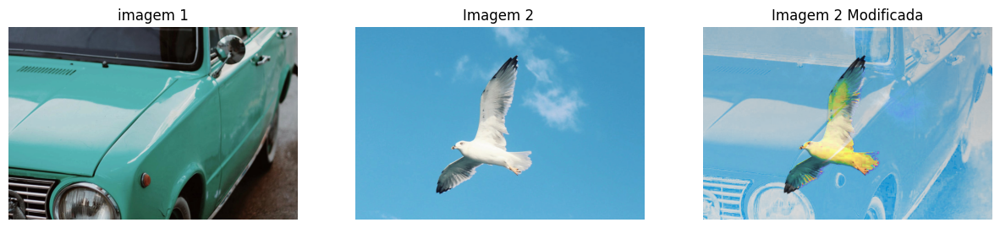

In [3]:
def AddSat(img,img2):

  sat_img1  = APLICA_RGB_HSB(img)
  sat_img2 = APLICA_RGB_HSB(img2)
  img2= sat_img2.copy()

  for i in range(sat_img1.shape[1]):
        for j in range(sat_img1.shape[0]):
             sat_img2[j][i][1] =  sat_img1[j][i][1]


  rgb_img2 = APLICA_HSB_RGB(sat_img2)
  img1 =  APLICA_HSB_RGB(sat_img1)
  img2 = APLICA_HSB_RGB(img2)
  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  axes[0].imshow(img1)
  axes[0].set_title('imagem 1')
  axes[0].set_axis_off()

  axes[1].imshow(img2)
  axes[1].set_title('Imagem 2 ')
  axes[1].set_axis_off()

  axes[2].imshow(rgb_img2)
  axes[2].set_title('Imagem 2 Modificada')
  axes[2].set_axis_off()
  return rgb_img2

teste = AddSat("entrada.jpg","saida3.jpg")

# QUESTÃO 04 - CORRELAÇÃO

In [7]:
# Define a função para ler o filtro no arquivo txt e transforma o filtro em uma matriz numpy
def ler_filtro(file_path):
    mask = []
    with open(file_path, 'r') as file:
        for line in file:
            row = [int(num) for num in line.split()]
            mask.append(row)
    return np.array(mask, dtype=float)

def correlação(imagem, masc):
    # Obter as dimensões da imagem e da máscara
    altura_img, largura_img = imagem.shape
    altura_masc, largura_masc = masc.shape

    # Criar uma nova imagem de saída com o mesmo tamanho da imagem original
    output_image = np.zeros((altura_img, largura_img))

    # Calcular as distâncias a partir do centro da máscara
    altura_pad = altura_masc // 2
    largura_pad = largura_masc // 2

    # Adicionar padding na imagem para tratar as bordas
    pad_image = np.pad(imagem, ((altura_pad, altura_pad), (largura_pad, largura_pad)), mode='constant', constant_values=0)

    # Realizar a operação de correlação
    for i in range(altura_img):
        for j in range(largura_img):
            # Extrair a região da imagem para correlação
            region = pad_image[i:i+altura_masc, j:j+largura_masc]

            # Realizar a correlação (element-wise multiplication and sum)
            output_value = np.sum(region * masc)

            # Atribuir o resultado ao pixel central na imagem de saída
            output_image[i, j] = output_value

    return output_image

# Função para aplicar a correlação em uma imagem utilizando a máscara de um filtro
def aplicar_filtro(caminho, filtro):
    img = Image.open(caminho)
    img = img.convert('RGB')  # Garantindo que a imagem está no modo RGB
    img_array = np.array(img)

    # Separando os canais R, G, B
    R, G, B = img_array[:,:,0], img_array[:,:,1], img_array[:,:,2]

    # Normalizando a máscara do filtro
    filtro = filtro / filtro.sum()

    # Aplicando a correlação em cada canal
    R_filtered = correlação(R, filtro)
    G_filtered = correlação(G, filtro)
    B_filtered = correlação(B, filtro)

    # Reconstruindo a imagem filtrada
    img_filtrada = np.stack([R_filtered, G_filtered, B_filtered], axis=-1).clip(0, 255).astype(np.uint8)

    return img_filtrada

# Função para aplicar a correlação usando o filtro de Sobel sem normalização por conta da soma zero
def aplicar_filtro_sobel(caminho, filtro):
    img = Image.open(caminho)
    img = img.convert('RGB')
    img_array = np.array(img)

    R, G, B = img_array[:,:,0], img_array[:,:,1], img_array[:,:,2]

    R_filtered = correlação(R, filtro)
    G_filtered = correlação(G, filtro)
    B_filtered = correlação(B, filtro)

    img_filtrada = np.stack([R_filtered, G_filtered, B_filtered], axis=-1).clip(0, 255).astype(np.uint8)

    # Cálculo do histograma da imagem original
    hist_original = calcular_histograma(img_array)

    # Cálculo do histograma da imagem filtrada
    hist_filtrada = calcular_histograma(img_filtrada)

    # Plotar os histogramas
    mostrar_histograma(hist_original, "Histograma Original")
    mostrar_histograma(hist_filtrada, "Histograma Filtrada")
    # Visualizar imagens usando Matplotlib
    plt.figure(figsize=(10, 6))

    plt.subplot(121)
    plt.imshow(img)
    plt.title('Imagem original')
    plt.axis('off')  # Ocultar os eixos da imagem original

    plt.subplot(122)
    plt.imshow(img_filtrada)
    plt.title('Imagem com filtro de Sobel')
    plt.axis('off')  # Ocultar os eixos da imagem filtrada

    plt.tight_layout()
    plt.show()

    return img_filtrada


# Função para calcular o histograma de uma imagem
def calcular_histograma(imagem):
    hist = np.zeros(256)
    for i in range(imagem.shape[0]):
        for j in range(imagem.shape[1]):
            hist[imagem[i, j]] += 1
    return hist

# Função para plotar o histograma
def mostrar_histograma(hist, titulo):
    import matplotlib.pyplot as plt
    plt.plot(hist)
    plt.title(titulo)
    plt.xlabel("Valor do pixel")  
    plt.ylabel("Frequência")  
    plt.show()

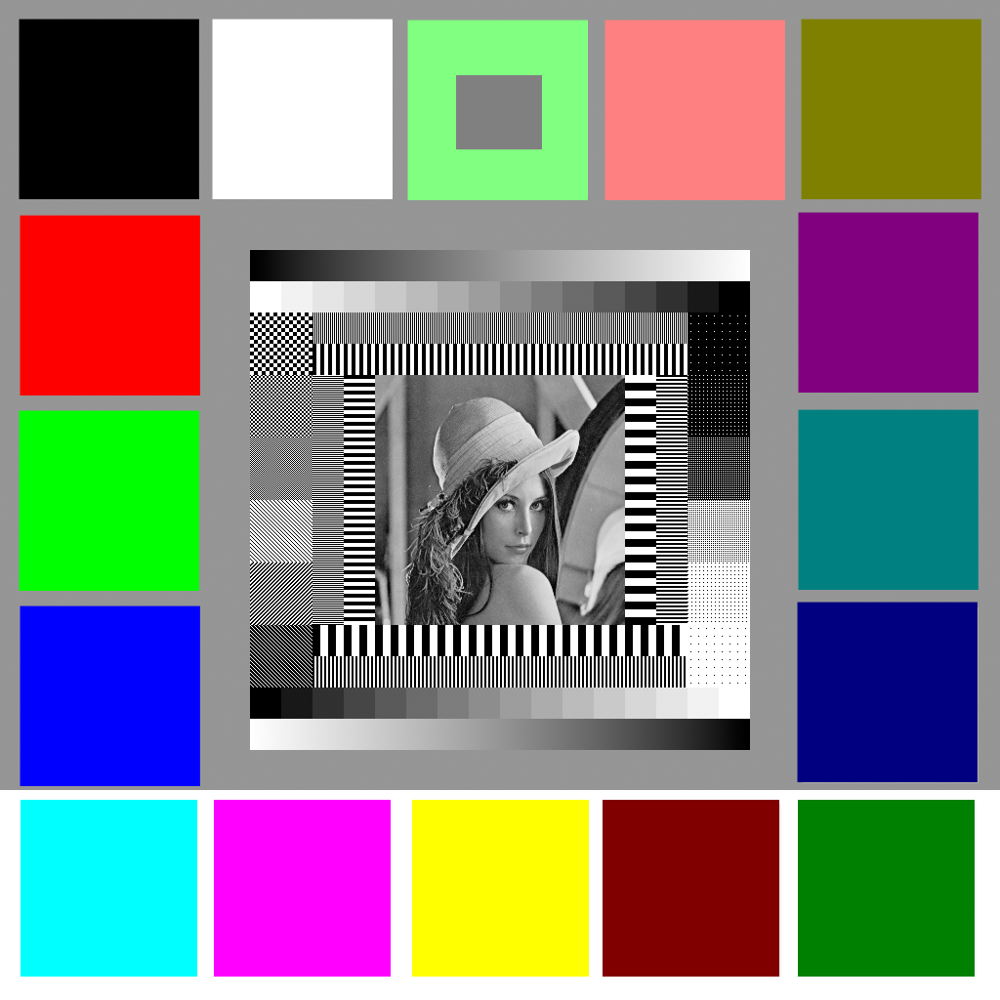

In [5]:
# Caminho do arquivo
caminho = 'F:/Programação/PDI/testpat.1k.color2.tif'

#Abre a imagem
imagem = open_image(caminho)
imagem

## Lendo a máscara de cada filtro

In [9]:
masc_gaussiana = ler_filtro('F:/Programação/PDI/Gaussiano 5x5.txt')
masc_box = ler_filtro('F:/Programação/PDI/Box 1x26.txt')
masc_SH = ler_filtro('F:/Programação/PDI/Sobel horizontal.txt')
masc_SV = ler_filtro('F:/Programação/PDI/Sobel vertical.txt')

## Escolhe o filtro para aplicar na imagem

In [21]:
imagem_filtrada = aplicar_filtro(caminho, masc_gaussiana)

## Filtro de Sobel separado

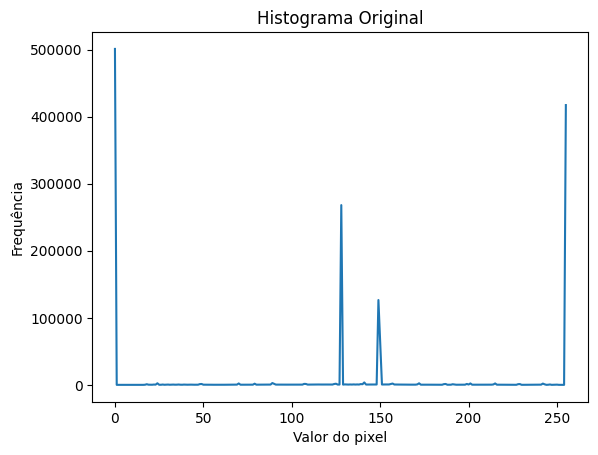

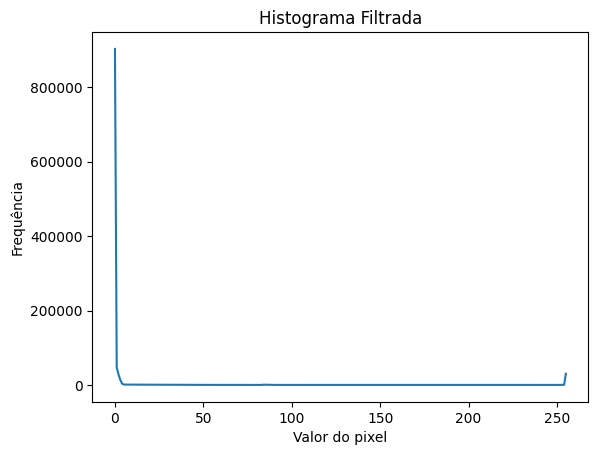

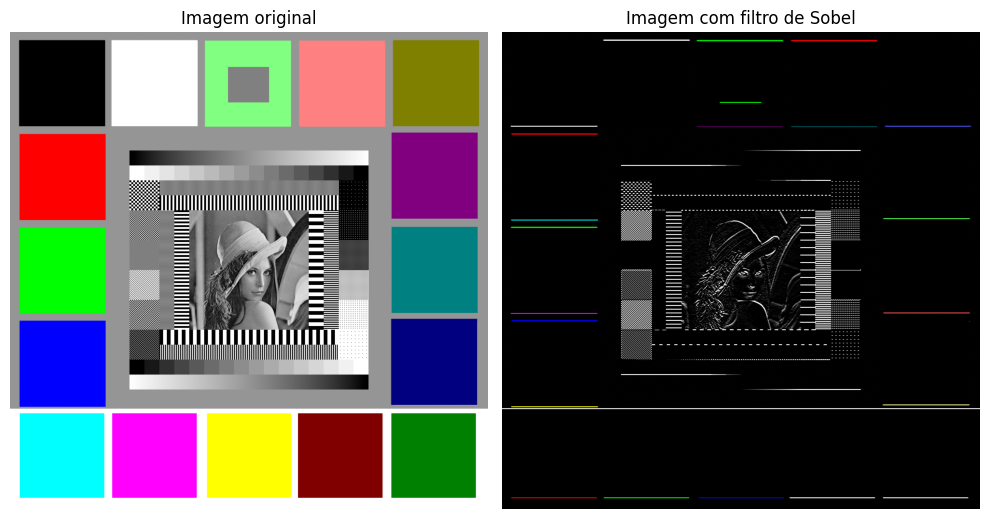

In [8]:
imagem_Sobel = aplicar_filtro_sobel(caminho, masc_SH)

## Selecionar a imagem utilizando gaus ou box/ Sobel H ou V

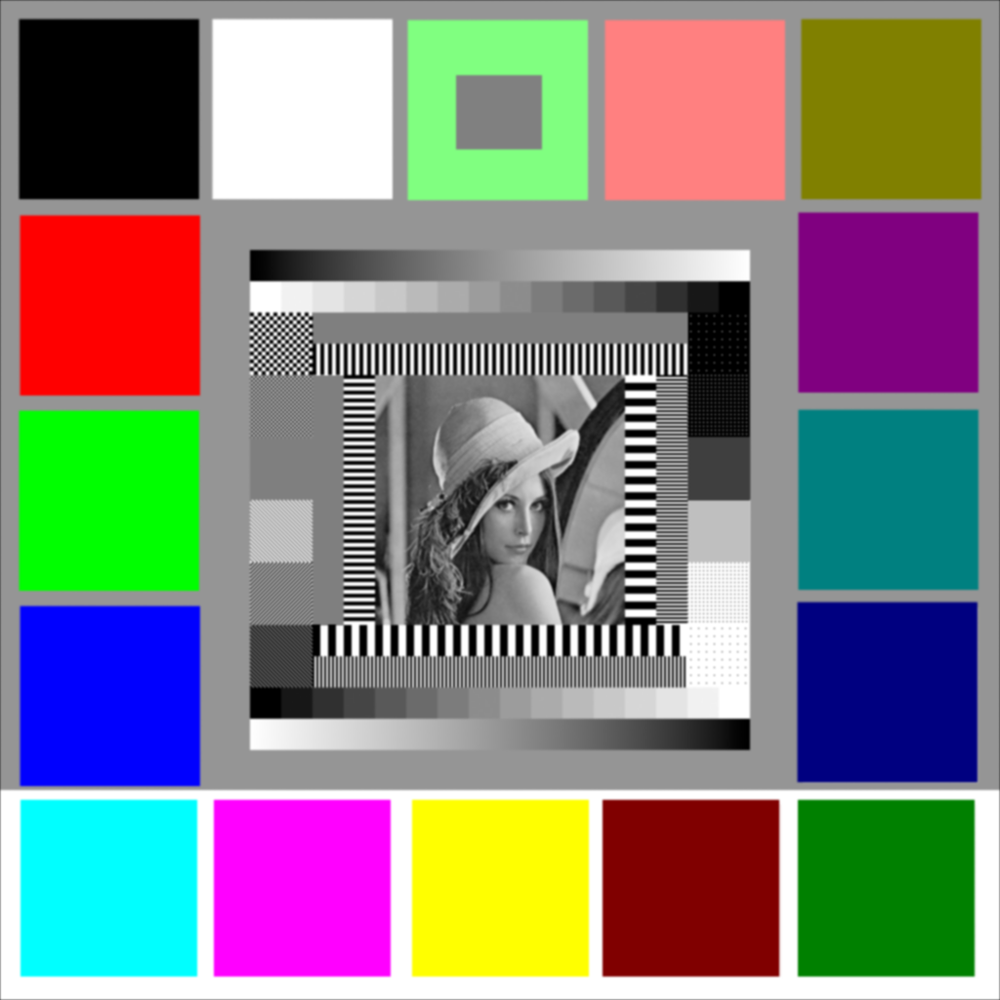

In [30]:
Img = Image.fromarray(imagem_filtrada)
Img

## Salva a Imagem

In [31]:
name = str(input("Informe um nome para a imagem: "))
ext = str(input("Informe a extensão da imagem: "))

save_image(Img, name, ext)

Informe um nome para a imagem:  seila
Informe a extensão da imagem:  png
